# StackOverFlow - The Technology Trends
ECE143 Project - Group 4

## SetUp

In [1]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 24.7 MB/s 
     |████████████████████████████████| 6.3 MB 71.0 MB/s 
     |████████████████████████████████| 16.7 MB 691 kB/s 


In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from matplotlib.pyplot import figure
import geopandas as gpd
from geopandas import GeoDataFrame
from wordcloud import WordCloud, STOPWORDS
import string
import pickle

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Data Processing

In [5]:
df = pd.read_csv('/content/drive/MyDrive/ECE143_Project/data/sof_questions2.csv')

In [6]:
tags_set = set(['python','c', 'c++', 'java','go','rust',
                'data-science', 'machine-learning', 'deep-learning', 'computer-vision', 'artificial-intelligence', 'nlp','reinforcement-learning',
              'pandas','numpy', 'dask', 'pyspark', 'hadoop', 'spark', 'scipy', 'statsmodels', 'scikit-learn','pytorch','tensorflow','keras',
              'spacy','nltk','opencv','huggingface','matplotlib','seaborn', 'fastai',
              'bokeh', 'pyviz', 'pycaret', 'plotly', 'visualization', 'cloud', 'bigdata',
              'azure','google-cloud-platform','aws', 'mlops', 'amazon-web-services', 'gcp',
              'docker','airflow','mlflow', 'kubeflow'])

In [ ]:
df['tags1'] = df['tags'].apply(lambda x: x.split('|'))
df['tags2'] = df['tags'].apply(lambda x: [i for i in x.split('|') if i in tags_set])

In [ ]:
df['tags2_split'] = df['tags2'].apply(lambda x: '|'.join(x))

In [ ]:
df['tags2_split'].nunique()

4458

In [ ]:
# df1 = df.sample(frac=0.05)
df1 = df.groupby('tags2_split', group_keys=False).apply(lambda x: x.sample(frac=0.5))

In [ ]:
df1.shape

(2844948, 15)

In [ ]:
df1['creation_month_yr'] = pd.to_datetime(df1['creation_date']).dt.to_period('M')
df1['creation_quarter'] = pd.to_datetime(df1['creation_date']).dt.to_period('Q')

In [ ]:
df1.to_csv('/content/drive/MyDrive/ECE143_Project/data/sof_questions_filtered.csv', header=True, index=False)

In [7]:
lst = [df]
del df
del lst

## Overall Trends

In [8]:
df1 = pd.read_csv('/content/drive/MyDrive/ECE143_Project/data/sof_questions_filtered.csv')

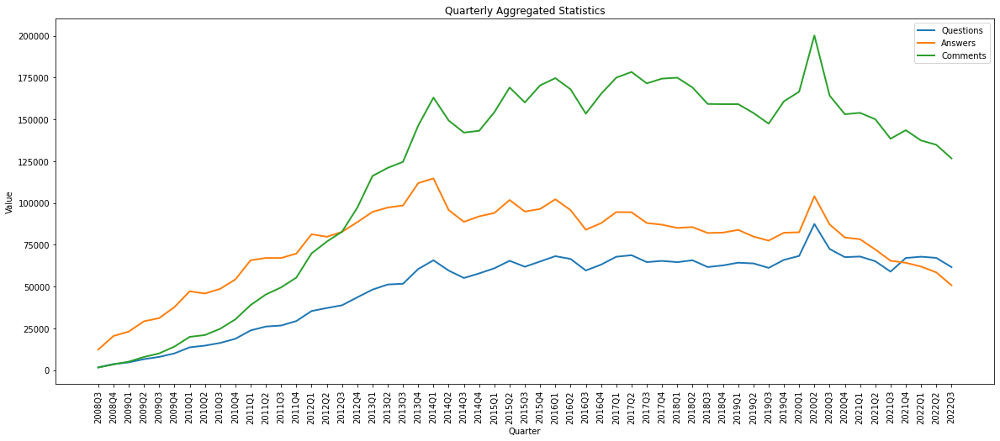

In [9]:
overall_trends = df1.groupby('creation_quarter').agg(
    questions=pd.NamedAgg(column='id', aggfunc='count'), 
    answers=pd.NamedAgg(column='answer_count', aggfunc='sum'),
    comments=pd.NamedAgg(column='comment_count', aggfunc='sum'),
    score=pd.NamedAgg(column='score', aggfunc='sum'),
    views=pd.NamedAgg(column='view_count', aggfunc='sum'),
).reset_index()

plt.figure(figsize=(20, 8))
ax = sns.lineplot(x=overall_trends["creation_quarter"].astype(str), y=overall_trends['questions'], label='Questions', linewidth=2)
ax = sns.lineplot(x=overall_trends["creation_quarter"].astype(str), y=overall_trends['answers'], label='Answers', linewidth=2)
ax = sns.lineplot(x=overall_trends["creation_quarter"].astype(str), y=overall_trends['comments'], label='Comments', linewidth=2)
plt.xlabel('Quarter')
plt.ylabel('Value')
plt.title('Quarterly Aggregated Statistics')
ax.tick_params(axis='x', labelrotation=90)

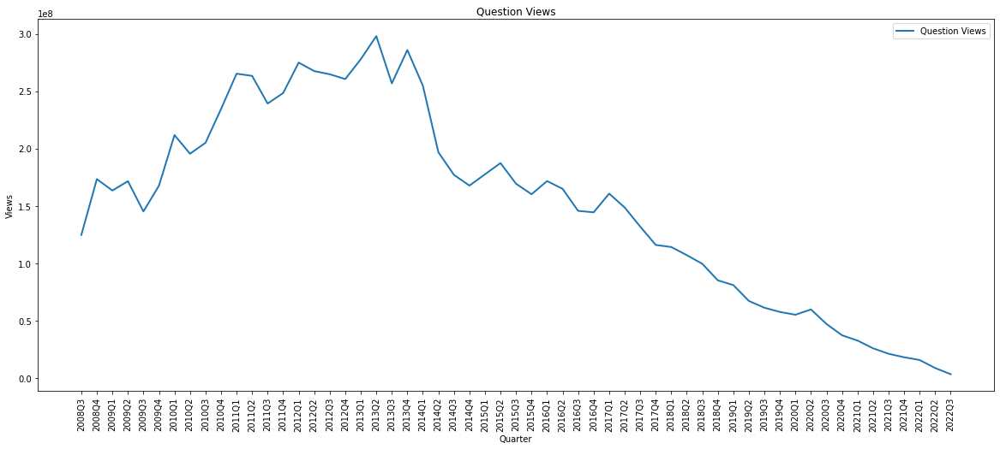

In [10]:
plt.figure(figsize=(20, 8))
ax = sns.lineplot(x=overall_trends["creation_quarter"].astype(str), y=overall_trends['views'], label='Question Views', linewidth=2)
plt.xlabel('Quarter')
plt.ylabel('Views')
plt.title('Question Views')
ax.tick_params(axis='x', labelrotation=90)

## Tag Statistics

In [11]:
df1['tags1'] = df1['tags'].apply(lambda x: x.split('|'))
df1['tags2'] = df1['tags'].apply(lambda x: [i for i in x.split('|') if i in tags_set])

In [12]:
tags_df = df1[['creation_quarter', 'tags2', 'answer_count', 'comment_count', 'view_count', 'score']]
tags_df.shape

(2844948, 6)

In [13]:
tags_df = tags_df.explode('tags2')

In [14]:
tag_trends = tags_df.groupby(['creation_quarter','tags2']).agg(
    questions=pd.NamedAgg(column='tags2', aggfunc='count'), 
).reset_index()

In [15]:
tag_trends2 = tag_trends.pivot(index='creation_quarter', columns='tags2', values='questions')

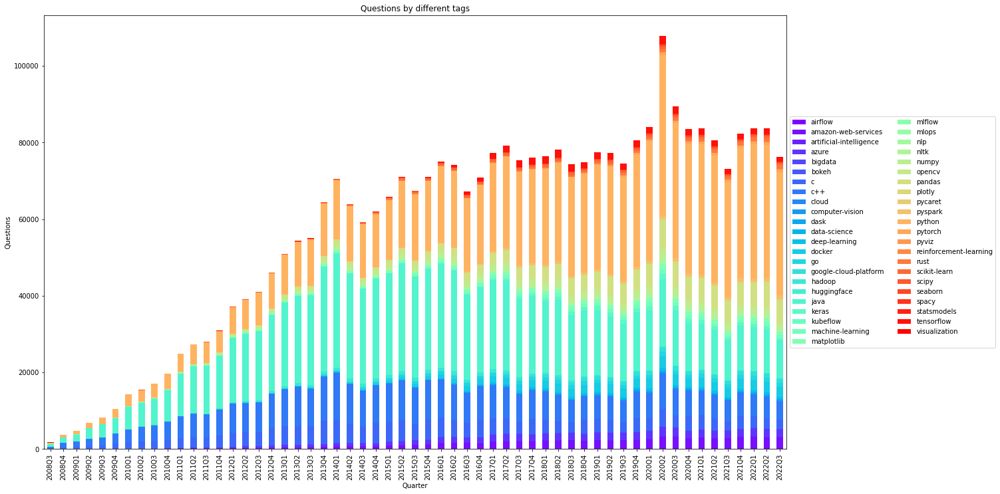

In [16]:
f=  plt.figure(figsize=(20, 12))
ax = tag_trends2.plot(kind='bar', stacked=True, ax=f.gca(), cmap='rainbow')
plt.xlabel('Quarter')
plt.ylabel('Questions')
plt.title('Questions by different tags')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=2)
ax.tick_params(axis='x', labelrotation=90)

## Trends by Tag

In [17]:
topic_tags = {
    'prog': ['c', 'c++', 'java', 'python', 'go', 'rust'],
    'python_pkgs': ['bokeh', 'dask', 'huggingface', 'keras', 'matplotlib', 'mlflow', 'airflow', 'fastai', 'nltk', 'numpy', 
                    'opencv', 'pandas', 'plotly', 'pycaret', 'pyspark', 'pytorch', 'pyviz', 'scikit-learn', 'scipy', 'seaborn',
                    'spacy', 'statsmodels', 'tensorflow'],
    'big_data': ['dask', 'bigdata', 'hadoop', 'spark', 'pyspark'],
    'ds': ['artificial-intelligence', 'computer-vision', 'data-science', 'deep-learning', 'machine-learning', 'nlp', 'reinforcement-learning', 'visualization'],
    'ds_fields': ['artificial-intelligence', 'computer-vision', 'nlp', 'reinforcement-learning', 'visualization'],
    'cloud': ['aws', 'amazon-web-services', 'azure', 'cloud', 'google-cloud-platform', 'gcp'],
    'mlops': ['airflow', 'docker', 'fastai', 'kubeflow', 'mlflow', 'mlops', ],
}

In [18]:
tag_trends_prog = tag_trends[tag_trends['tags2'].isin(topic_tags['prog'])]
tag_trends_python = tag_trends[tag_trends['tags2'].isin(topic_tags['python_pkgs'])]
tag_trends_bigdata = tag_trends[tag_trends['tags2'].isin(topic_tags['big_data'])]
tag_trends_ds = tag_trends[tag_trends['tags2'].isin(topic_tags['ds'])]
tag_trends_dsfields = tag_trends[tag_trends['tags2'].isin(topic_tags['ds_fields'])]
tag_trends_cloud = tag_trends[tag_trends['tags2'].isin(topic_tags['cloud'])]
tag_trends_mlops = tag_trends[tag_trends['tags2'].isin(topic_tags['mlops'])]

In [23]:
def process(tag_trends_python):
    a_tags = list(tag_trends_python["tags2"])
    set(a_tags)
    tagsTwo = []
    questions = []
    date = []
    for t in a_tags:
        tt = tag_trends_python[tag_trends_python["tags2"] == t]
    # rolling
    #     temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].rolling(window=5).mean())
    # ewm
        temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].ewm(span=5).mean())
        date.extend(list(tt["creation_quarter"]))
        length = len(temp)
        if len(temp) >= 4:
            temp[0] = temp[4]/6
            temp[1] = temp[4]/4
            temp[2] = temp[4]/3
            temp[2] = temp[4]/2
        tagsTwo.extend(length*[t])
        questions.extend(temp)
    new_tag_trends_python = pd.DataFrame()
    new_tag_trends_python["creation_quarter"] = date
    new_tag_trends_python["tags2"] = tagsTwo
    new_tag_trends_python["questions"] = questions

    return new_tag_trends_python

new_tag_trends_prog = process(tag_trends_prog)

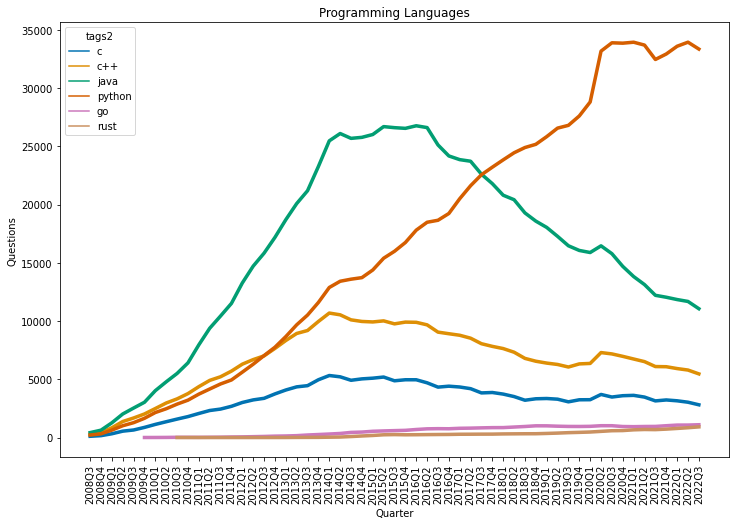

In [33]:
plt.figure(figsize=(12, 8))
palette = sns.color_palette("colorblind", new_tag_trends_prog['tags2'].nunique())
ax = sns.lineplot(x=new_tag_trends_prog['creation_quarter'].astype(str), y='questions', hue='tags2', data=new_tag_trends_prog,palette = palette,lw=3.5)
plt.xlabel('Quarter')
plt.ylabel('Questions')
plt.title('Programming Languages')
ax.tick_params(axis='x', labelrotation=90)

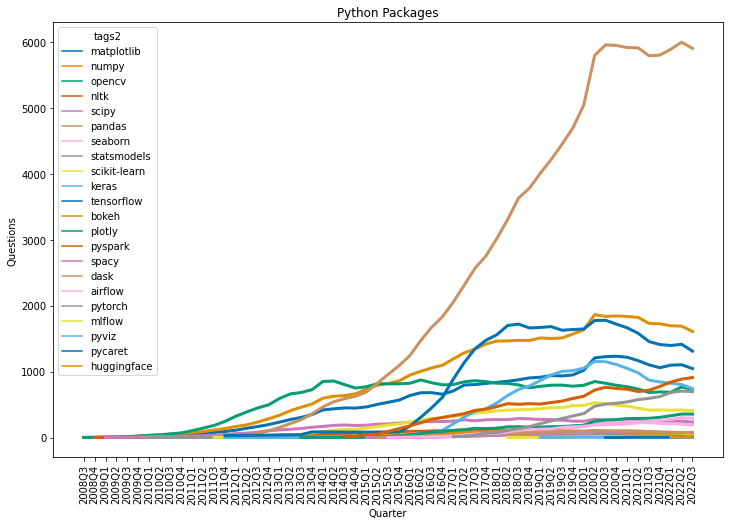

In [34]:
def process(tag_trends_python):
    a_tags = list(tag_trends_python["tags2"])
    set(a_tags)
    tagsTwo = []
    questions = []
    date = []
    for t in a_tags:
        tt = tag_trends_python[tag_trends_python["tags2"] == t]
    # rolling
    #     temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].rolling(window=5).mean())
    # ewm
        temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].ewm(span=5).mean())
        date.extend(list(tt["creation_quarter"]))
        length = len(temp)
        if len(temp) >= 4:
            temp[0] = temp[4]/6
            temp[1] = temp[4]/4
            temp[2] = temp[4]/3
            temp[2] = temp[4]/2
        tagsTwo.extend(length*[t])
        questions.extend(temp)
    new_tag_trends_python = pd.DataFrame()
    new_tag_trends_python["creation_quarter"] = date
    new_tag_trends_python["tags2"] = tagsTwo
    new_tag_trends_python["questions"] = questions
    new_tag_trends_python
    return new_tag_trends_python

new_tag_trends_python = process(tag_trends_python)
palette = sns.color_palette("colorblind", n_colors=new_tag_trends_python['tags2'].nunique())
plt.figure(figsize=(12, 8))
ax = sns.lineplot(x=new_tag_trends_python['creation_quarter'].astype(str), y='questions', hue='tags2', data=new_tag_trends_python,palette = palette,lw=3)
plt.xlabel('Quarter')
plt.ylabel('Questions')
plt.title('Python Packages')
ax.tick_params(axis='x', labelrotation=90)

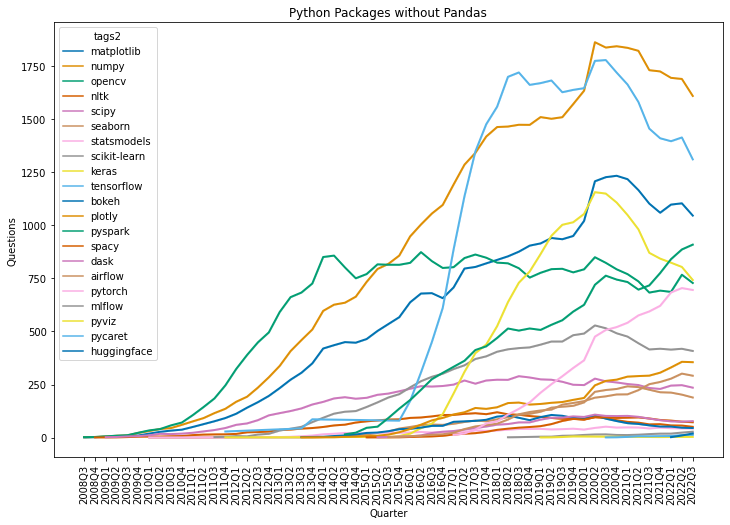

In [35]:
def process(tag_trends_python):
    a_tags = list(tag_trends_python["tags2"])
    set(a_tags)
    
#     a_tags.remove('pandas')
    tagsTwo = []
    questions = []
    date = []
    for t in a_tags:
        if t == "pandas":
            continue
        tt = tag_trends_python[tag_trends_python["tags2"] == t]
    # rolling
    #     temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].rolling(window=5).mean())
    # ewm
        temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].ewm(span=5).mean())
        date.extend(list(tt["creation_quarter"]))
        length = len(temp)
        if len(temp) >= 4:
            temp[0] = temp[4]/6
            temp[1] = temp[4]/4
            temp[2] = temp[4]/3
            temp[2] = temp[4]/2
        tagsTwo.extend(length*[t])
        questions.extend(temp)
    new_tag_trends_python = pd.DataFrame()
    new_tag_trends_python["creation_quarter"] = date
    new_tag_trends_python["tags2"] = tagsTwo
    new_tag_trends_python["questions"] = questions
    new_tag_trends_python
    return new_tag_trends_python

new_tag_trends_python = process(tag_trends_python)
palette = sns.color_palette("colorblind", new_tag_trends_python['tags2'].nunique())
plt.figure(figsize=(12, 8))
ax = sns.lineplot(x=new_tag_trends_python['creation_quarter'].astype(str), y='questions', hue='tags2', data=new_tag_trends_python,palette = palette,lw=2)
plt.xlabel('Quarter')
plt.ylabel('Questions')
plt.title('Python Packages without Pandas')
ax.tick_params(axis='x', labelrotation=90)

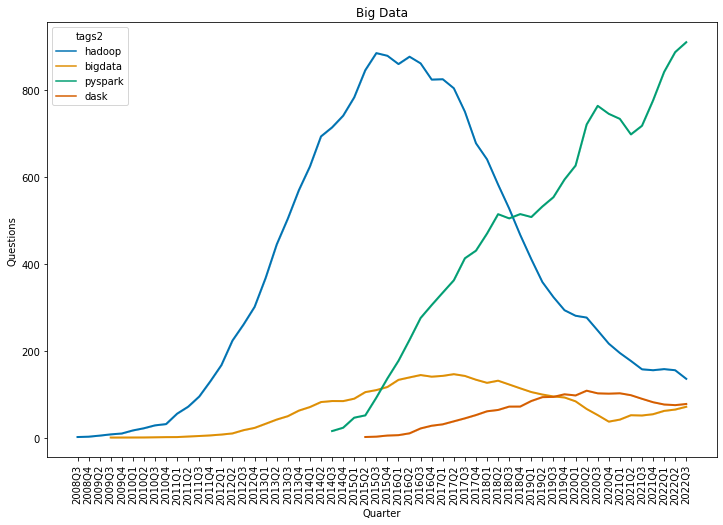

In [36]:
def process(tag_trends_python):
    a_tags = list(tag_trends_python["tags2"])
    set(a_tags)
    
#     a_tags.remove('pandas')
    tagsTwo = []
    questions = []
    date = []
    for t in a_tags:
        if t == "pandas":
            continue
        tt = tag_trends_python[tag_trends_python["tags2"] == t]
    # rolling
    #     temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].rolling(window=5).mean())
    # ewm
        temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].ewm(span=5).mean())
        date.extend(list(tt["creation_quarter"]))
        length = len(temp)
        if len(temp) >= 4:
            temp[0] = temp[4]/6
            temp[1] = temp[4]/4
            temp[2] = temp[4]/3
            temp[2] = temp[4]/2
        tagsTwo.extend(length*[t])
        questions.extend(temp)
    new_tag_trends_python = pd.DataFrame()
    new_tag_trends_python["creation_quarter"] = date
    new_tag_trends_python["tags2"] = tagsTwo
    new_tag_trends_python["questions"] = questions
    new_tag_trends_python
    return new_tag_trends_python

new_tag_trends_bigdata = process(tag_trends_bigdata)
palette = sns.color_palette("colorblind", new_tag_trends_bigdata['tags2'].nunique())
plt.figure(figsize=(12, 8))
ax = sns.lineplot(x=new_tag_trends_bigdata['creation_quarter'].astype(str), y='questions', hue='tags2', data=new_tag_trends_bigdata,palette = palette,lw=2)
plt.xlabel('Quarter')
plt.ylabel('Questions')
plt.title('Big Data')
ax.tick_params(axis='x', labelrotation=90)

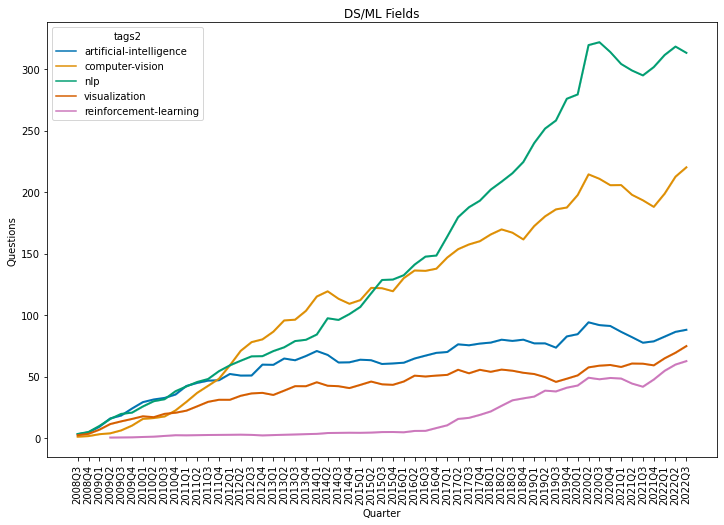

In [32]:
def process(tag_trends_python):
    a_tags = list(tag_trends_python["tags2"])
    set(a_tags)
    
#     a_tags.remove('pandas')
    tagsTwo = []
    questions = []
    date = []
    for t in a_tags:
        if t == "pandas":
            continue
        tt = tag_trends_python[tag_trends_python["tags2"] == t]
    # rolling
    #     temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].rolling(window=5).mean())
    # ewm
        temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].ewm(span=7).mean())
        date.extend(list(tt["creation_quarter"]))
        length = len(temp)
        if len(temp) >= 4:
            temp[0] = temp[4]/6
            temp[1] = temp[4]/4
            temp[2] = temp[4]/3
            temp[2] = temp[4]/2
        tagsTwo.extend(length*[t])
        questions.extend(temp)
    new_tag_trends_python = pd.DataFrame()
    new_tag_trends_python["creation_quarter"] = date
    new_tag_trends_python["tags2"] = tagsTwo
    new_tag_trends_python["questions"] = questions
    new_tag_trends_python
    return new_tag_trends_python

new_tag_trends_dsfields = process(tag_trends_dsfields)
palette = sns.color_palette("colorblind", n_colors=new_tag_trends_dsfields['tags2'].nunique())
plt.figure(figsize=(12, 8))
ax = sns.lineplot(x=new_tag_trends_dsfields['creation_quarter'].astype(str), y='questions', hue='tags2', data=new_tag_trends_dsfields,palette = palette,lw=2)
plt.xlabel('Quarter')
plt.ylabel('Questions')
plt.title('DS/ML Fields')
ax.tick_params(axis='x', labelrotation=90)

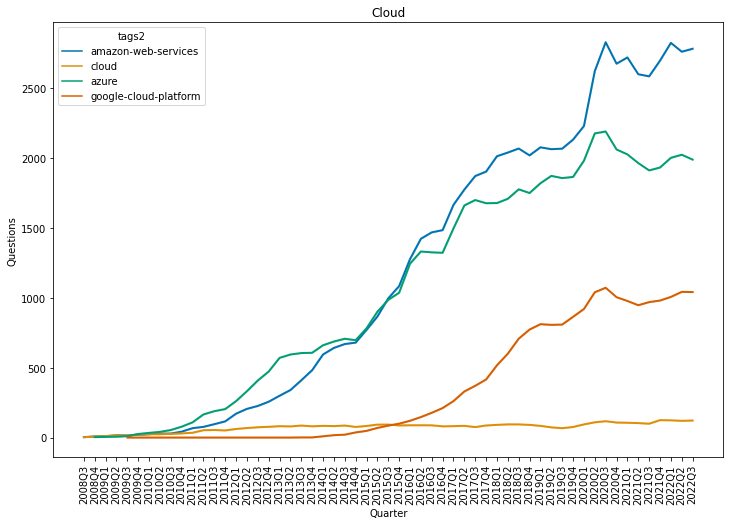

In [37]:
def process(tag_trends_python):
    a_tags = list(tag_trends_python["tags2"])
    set(a_tags)
    
#     a_tags.remove('pandas')
    tagsTwo = []
    questions = []
    date = []
    for t in a_tags:
        tt = tag_trends_python[tag_trends_python["tags2"] == t]
    # rolling
    #     temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].rolling(window=5).mean())
    # ewm
        temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].ewm(span=3).mean())
        date.extend(list(tt["creation_quarter"]))
        length = len(temp)
#         if len(temp) >= 4:
#             temp[0] = temp[4]/6
#             temp[1] = temp[4]/4
#             temp[2] = temp[4]/3
#             temp[2] = temp[4]/2
        tagsTwo.extend(length*[t])
        questions.extend(temp)
    new_tag_trends_python = pd.DataFrame()
    new_tag_trends_python["creation_quarter"] = date
    new_tag_trends_python["tags2"] = tagsTwo
    new_tag_trends_python["questions"] = questions
    new_tag_trends_python
    return new_tag_trends_python

new_tag_trends_cloud = process(tag_trends_cloud)
palette = sns.color_palette("colorblind", n_colors=new_tag_trends_cloud['tags2'].nunique())

plt.figure(figsize=(12, 8))
ax = sns.lineplot(x=new_tag_trends_cloud['creation_quarter'].astype(str), y='questions', hue='tags2', data=new_tag_trends_cloud,palette = palette,lw=2)
plt.xlabel('Quarter')
plt.ylabel('Questions')
plt.title('Cloud')
ax.tick_params(axis='x', labelrotation=90)

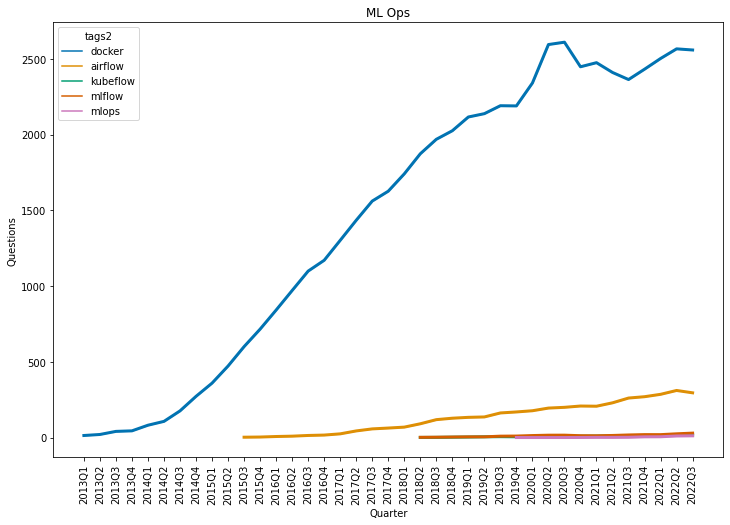

In [38]:
def process(tag_trends_python):
    a_tags = list(tag_trends_python["tags2"])
    set(a_tags)
    
#     a_tags.remove('pandas')
    tagsTwo = []
    questions = []
    date = []
    for t in a_tags:
        tt = tag_trends_python[tag_trends_python["tags2"] == t]
    # rolling
    #     temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].rolling(window=5).mean())
    # ewm
        temp = list(tag_trends_python[tag_trends_python["tags2"] == t]['questions'].ewm(span=4).mean())
        date.extend(list(tt["creation_quarter"]))
        length = len(temp)
        if len(temp) >= 4:
            temp[0] = temp[4]/6
            temp[1] = temp[4]/4
            temp[2] = temp[4]/3
            temp[2] = temp[4]/2
        tagsTwo.extend(length*[t])
        questions.extend(temp)
    new_tag_trends_python = pd.DataFrame()
    new_tag_trends_python["creation_quarter"] = date
    new_tag_trends_python["tags2"] = tagsTwo
    new_tag_trends_python["questions"] = questions
    new_tag_trends_python
    return new_tag_trends_python

new_tag_trends_mlops = process(tag_trends_mlops)
palette = sns.color_palette("colorblind", n_colors=new_tag_trends_mlops['tags2'].nunique())

plt.figure(figsize=(12, 8))
ax = sns.lineplot(x=new_tag_trends_mlops['creation_quarter'].astype(str), y='questions', hue='tags2', data=new_tag_trends_mlops,palette = palette,lw=3)
plt.xlabel('Quarter')
plt.ylabel('Questions')
plt.title('ML Ops')
ax.tick_params(axis='x', labelrotation=90)

## Co-occurences Matrix

In [40]:
cols = ['id', 'tags', 'q_user_location', 'tags1', 'tags2']
df = pd.read_csv('/content/drive/MyDrive/ECE143_Project/data/sof_questions_filtered.csv', usecols = cols, dtype={'owner_user_id': 'float64'})

though the columns are present, we re-run for safety

In [41]:
df['tags_all'] = df['tags'].apply(lambda x: x.split('|'))

tags_set = set(['python','c', 'c++', 'java','go','rust',
                'data-science', 'machine-learning', 'deep-learning', 'computer-vision', 'artificial-intelligence', 'nlp','reinforcement-learning',
              'pandas','numpy', 'dask', 'pyspark', 'hadoop', 'spark', 'scipy', 'statsmodels', 'scikit-learn','pytorch','tensorflow','keras',
              'spacy','nltk','opencv','huggingface','matplotlib','seaborn', 'fastai',
              'bokeh', 'pyviz', 'pycaret', 'plotly', 'visualization', 'cloud', 'bigdata',
              'azure','google-cloud-platform','aws', 'mlops', 'amazon-web-services', 'gcp',
              'docker','airflow','mlflow', 'kubeflow'])

df['tags_main'] = df['tags'].apply(lambda x: [i for i in x.split('|') if i in tags_set])

remove unwanted list of fields

In [42]:
unwanted_elements = ['machine-learning', 'deep-learning', 'computer-vision', 'artificial-intelligence','python','bigdata']

for x in unwanted_elements:
      tags_set.remove(x)
      

get the co-occurence matrix

In [43]:
tags_list = df['tags_all'].tolist()
tags_sents = [' '.join(x) for x in tags_list]
count_model = CountVectorizer(ngram_range=(1,1), vocabulary=list(tags_set))
counts = count_model.fit_transform(tags_sents)
co_occurence = (counts.T * counts)
co_occurence.setdiag(0)
co_occurence_matrix = co_occurence.todense()
co_occurence_df = pd.DataFrame(co_occurence_matrix,columns = count_model.vocabulary_.keys())

/usr/local/lib/python3.7/dist-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


plot heatmap of co-occurences

In [44]:
figure(figsize=(14, 14), dpi=1000)
plt.imshow(co_occurence_df, cmap ="nipy_spectral")#nipy_spectral,Dark2

plt.colorbar(fraction=0.046, pad=0.04)
# Assigning labels of x-axis 
# according to dataframe
plt.xticks(range(len(co_occurence_df)), co_occurence_df.columns,fontsize=14,rotation='vertical')
  
# Assigning labels of y-axis 
# according to dataframe
plt.yticks(range(len(co_occurence_df)), co_occurence_df.columns,fontsize=14)
  
# Displaying the figure
plt.show()

## Geo Analysis

name of USA different in world data (which is used later in this notebook), so we rename 'United States' to 'United States of America'

In [45]:
df['q_user_location'] = df['q_user_location'].replace({'United States': 'United States of America'})

aggregate location data, using locations of interest

In [46]:
locations = ['India','Germany','United States of America','United Kingdom','Israel','France','Canada','Italy','Netherlands','Australia','China','Russia','Japan','Sweden','Brazil','Switzerland']
loc_df = df[df['q_user_location'].isin(locations)]
locations_df = loc_df.groupby(['q_user_location']).agg(
    questions=pd.NamedAgg(column='q_user_location', aggfunc='count')).reset_index().sort_values('questions', ascending=False)

read dataset from geopandas (to get shapes of countries), merge it with the locations dataframe

In [47]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world = world[(world.pop_est>0) & (world.name!="Antarctica")]
world = world.merge(locations_df, how='left', left_on=['name'], right_on=['q_user_location'])

merged_df = GeoDataFrame(world)

plot "questions asked in a country" on a world map

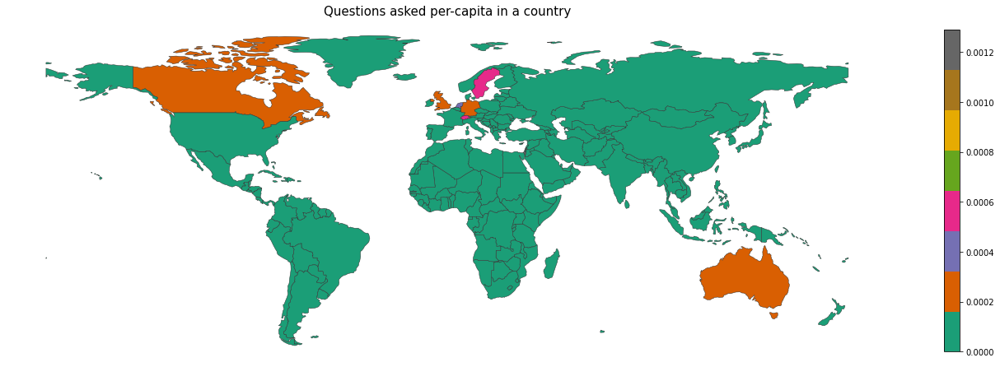

In [48]:
title_of_plot = "Questions asked per-capita in a country"
merged_df['questions']=merged_df['questions'].fillna(0)
merged_df['qs_per_cap'] = merged_df.questions / merged_df.pop_est
fig, ax = plt.subplots(1, figsize=(24, 24))
ax.axis('off')
ax.set_title(title_of_plot,fontdict={'fontsize': '15', 'fontweight' : '3'})
fig = merged_df.plot(column='qs_per_cap', cmap='Dark2', linewidth=0.5, ax=ax, edgecolor='0.2',legend=True,legend_kwds={'shrink': 0.3})

## Question Title - Word Clouds

In [2]:
df = pd.read_csv('/content/drive/MyDrive/ECE143_Project/data/sof_questions_filtered.csv')

In [3]:
# Removing tag words
topic_tags = { 
    'prog': ['c', 'c++', 'java', 'python', 'go', 'rust'],
    'python_pkgs': ['bokeh', 'dask', 'huggingface', 'keras', 'matplotlib', 'mlflow', 'airflow', 'fastai', 'nltk', 'numpy', 
                    'opencv', 'pandas', 'plotly', 'pycaret', 'pyspark', 'pytorch', 'pyviz', 'scikit-learn', 'scipy', 'seaborn',
                    'spacy', 'statsmodels', 'tensorflow'],
    'big_data': ['dask', 'bigdata', 'hadoop', 'spark', 'pyspark'],
    'ds': ['artificial-intelligence', 'computer-vision', 'data-science', 'deep-learning', 'machine-learning', 'nlp', 'reinforcement-learning', 'visualization'],
    'ds_fields': ['artificial-intelligence', 'computer-vision', 'nlp', 'reinforcement-learning', 'visualization'],
    'cloud': ['aws', 'amazon-web-services', 'azure', 'cloud', 'google-cloud-platform', ],
    'mlops': ['airflow', 'docker', 'fastai', 'kubeflow', 'mlflow', 'mlops', ],
}

tag_words = []

for field in topic_tags:
  for tag in topic_tags[field]:
    tag_words.append(tag)

tags_set = set(tag_words)

In [4]:
def str_preprocess(s):
  s = s.lower()
  s = "".join([char for char in s if char not in string.punctuation])
  return s

def topic_retrieval(s):
  topic_list = []
  for tag in s:
    for topic in topic_tags:
      if tag in topic_tags[topic]:
        topic_list.append(topic)
  return topic_list

In [5]:
df['title'] = df.title.transform(str_preprocess)
df['tags1'] = df['tags'].apply(lambda x: x.split('|'))
df['tags2'] = df['tags'].apply(lambda x: [i for i in x.split('|') if i in tags_set])
df['tag_topic'] = df['tags2'].apply(topic_retrieval)

In [ ]:
text = " ".join(s for s in df.title)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
plt.figure()
plt.imshow(wordcloud)
plt.axis("off")
plt.title("Most Commonly Found Words in the Title of StackOverflow Posts")
plt.show()

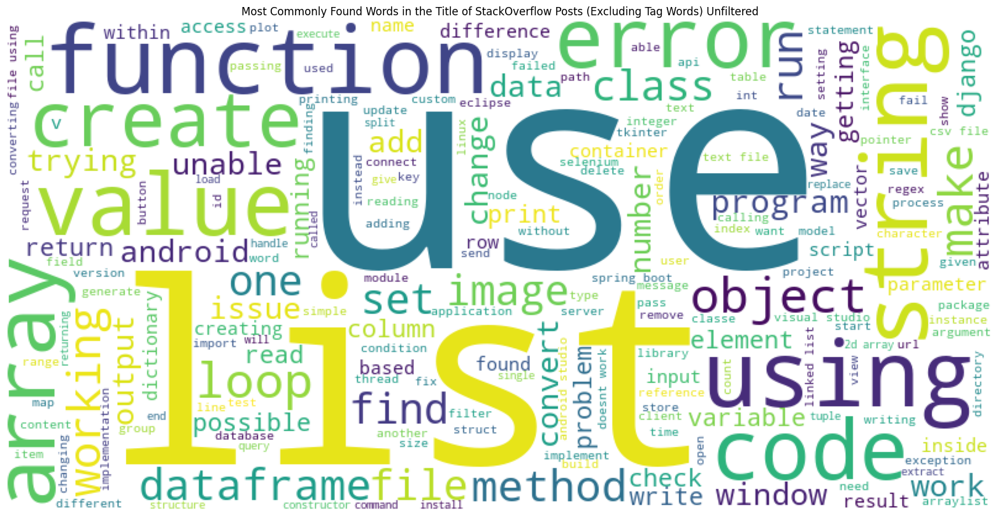

In [ ]:
stopwords = set(list(STOPWORDS) + tag_words)
wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(text)
plt.figure(figsize=(20, 20))
plt.imshow(wordcloud)
plt.axis("off")
plt.title("Most Commonly Found Words in the Title of StackOverflow Posts (Excluding Tag Words) Unfiltered")
plt.show()

In [ ]:
# Removing words with irrelevant parts of speech and irrelevant words in general
irrelevant = ['one', 'two', 'three', 'another', 'statement', 'problem', 'word', 'instead', 'group', 'studio', 'problems', 'connection', 'trouble', 
               'items', 'unit', 'status', 'will', 'issues', 'member', 'action', 'difference', 'already', 'size', 'line', 'really', 'always',
               'example', 'way', 'thing', 'may', 'nothing', 'number', 'anyone', 'well', 'anything', 'using', 'different', 'without', 'via',
               'specific', 'working', 'need', 'work', 'single', 'doesnt', 'adding', 'want', 'given', 'simple', 'use']

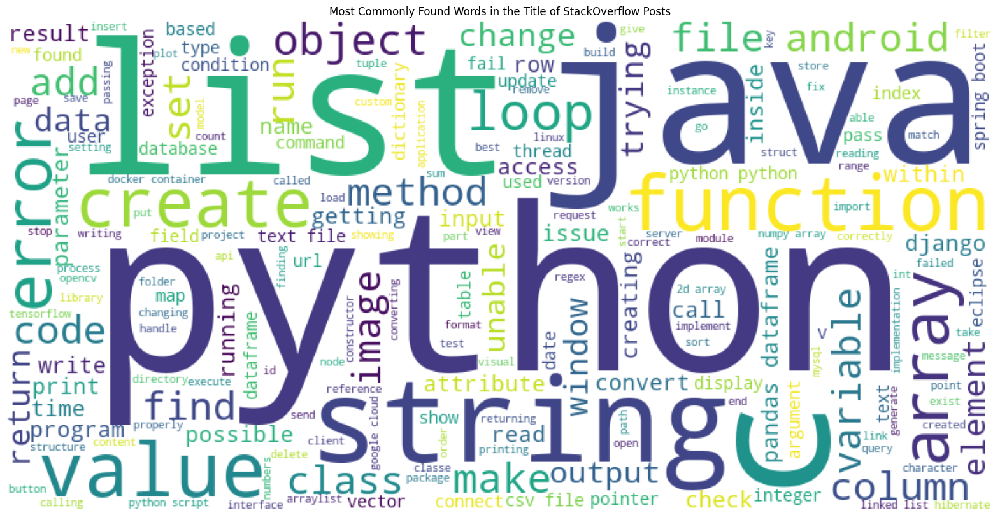

In [ ]:
stopwords = set(list(STOPWORDS) + irrelevant)
wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(text)
plt.figure(figsize=(20, 20))
plt.imshow(wordcloud)
plt.axis("off")
plt.title("Most Commonly Found Words in the Title of StackOverflow Posts")
plt.show()

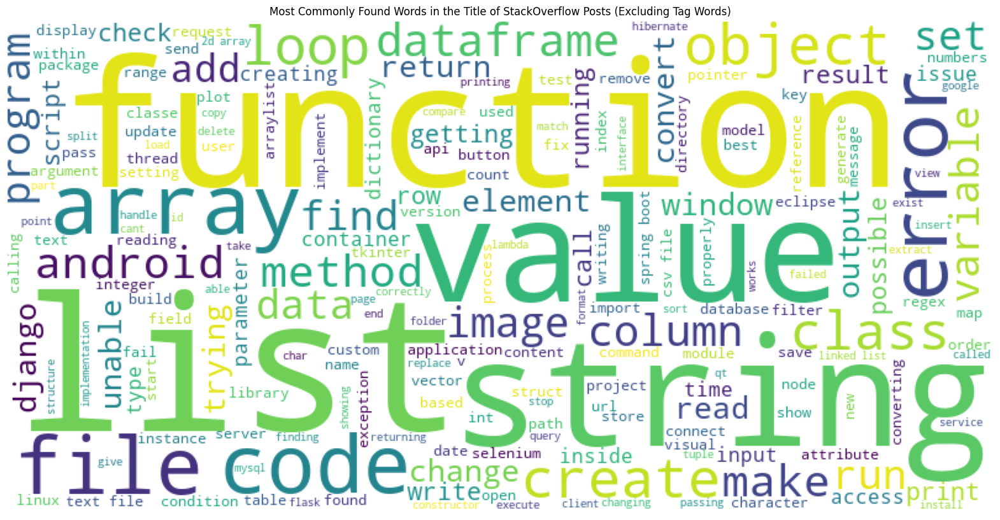

In [ ]:
stopwords = set(list(STOPWORDS) + irrelevant + tag_words)
wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(text)
plt.figure(figsize=(20, 20))
plt.imshow(wordcloud)
plt.axis("off")
plt.title("Most Commonly Found Words in the Title of StackOverflow Posts (Excluding Tag Words)")
plt.show()

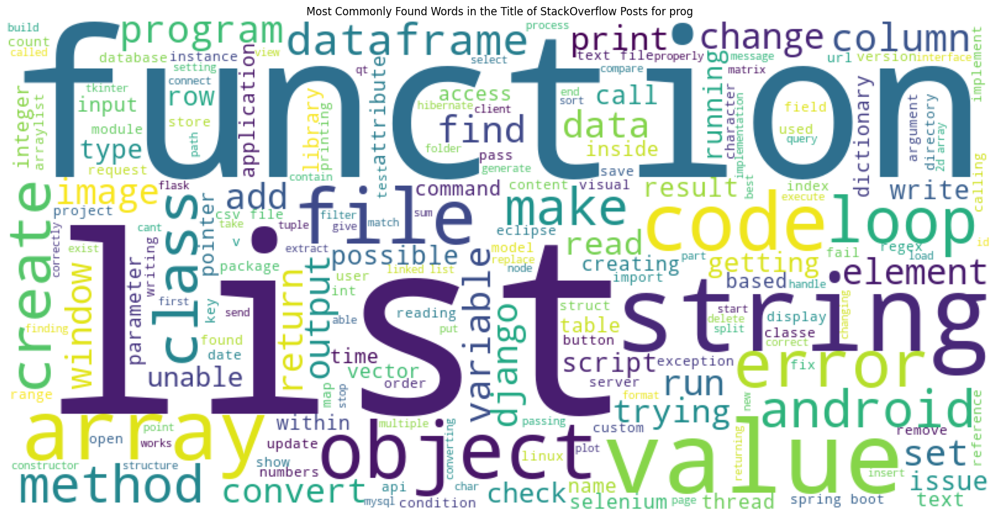

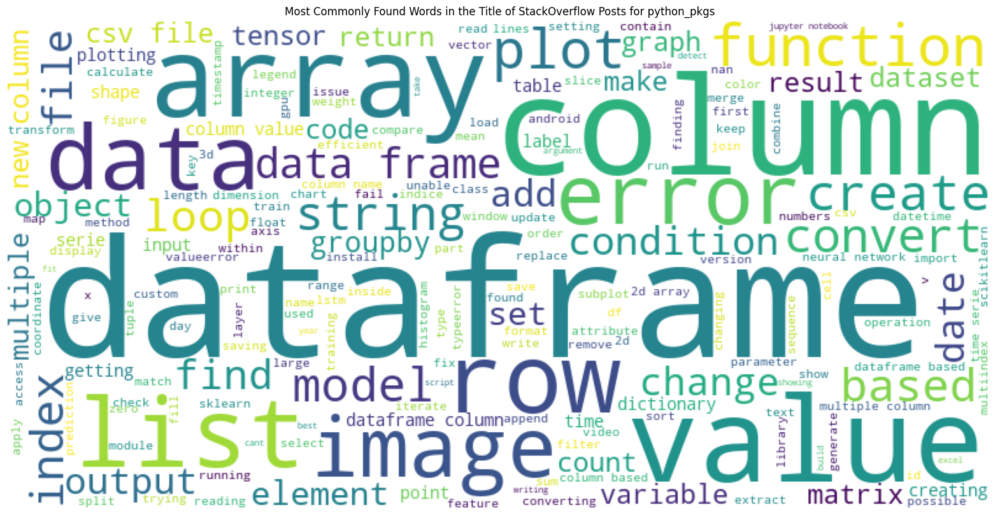

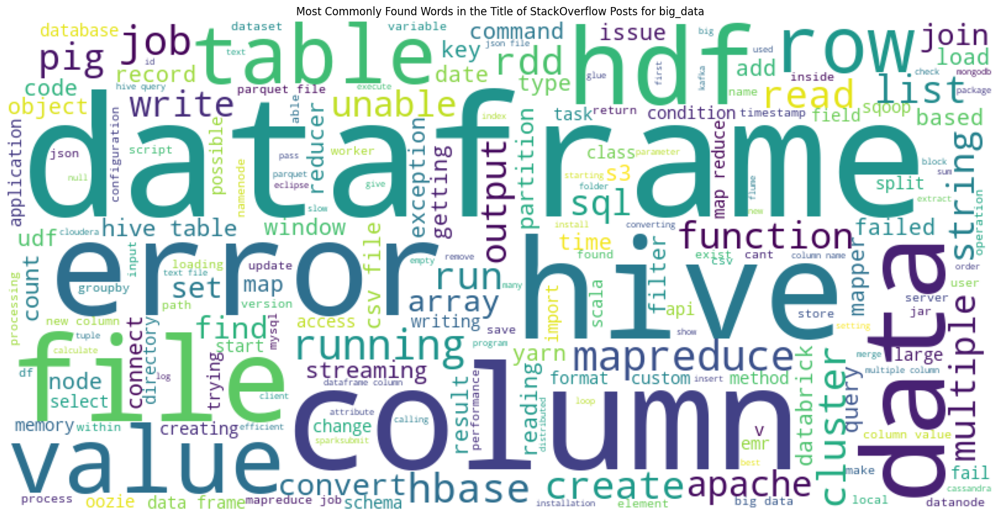

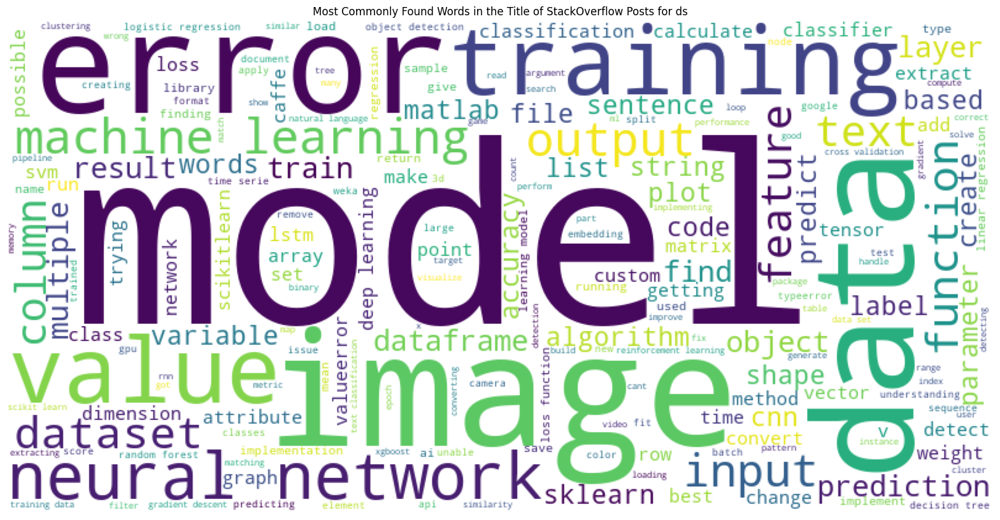

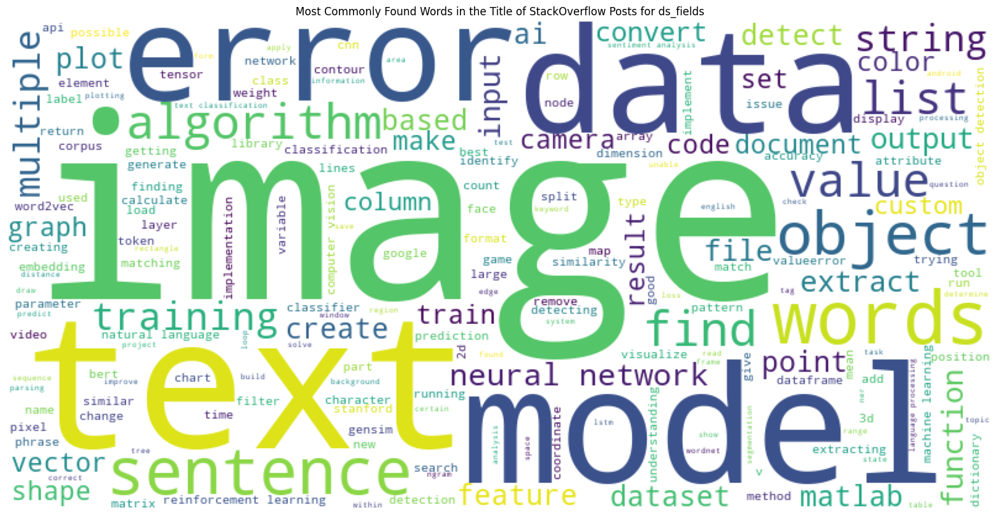

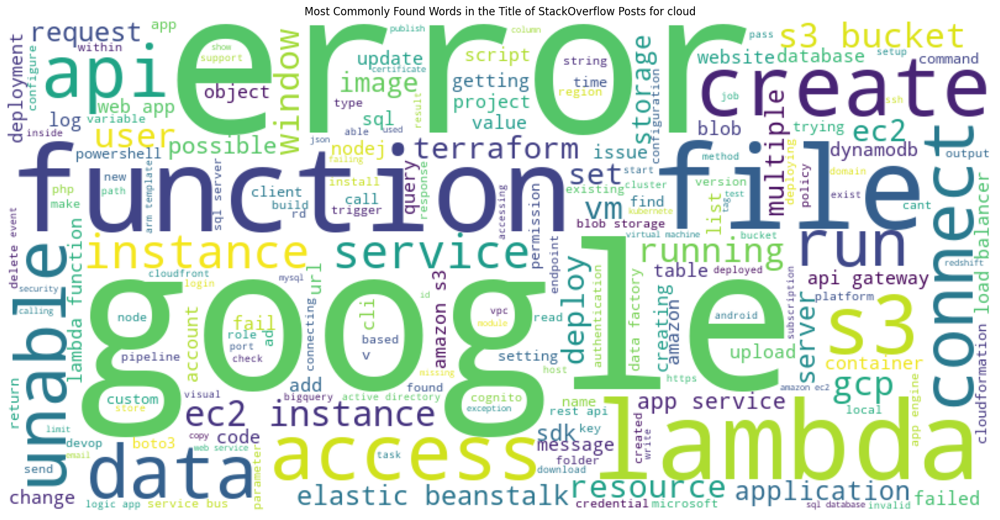

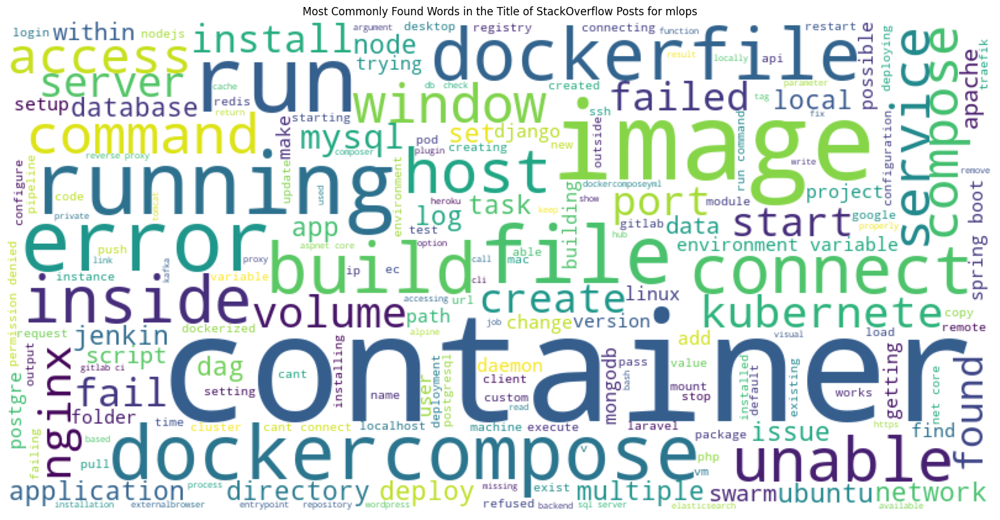

In [ ]:
for topic in topic_tags:  
  text = " ".join(s for s in df[[topic in d for d in list(df['tag_topic'])]].title)
  stopwords = set(list(STOPWORDS) + tag_words + irrelevant)
  wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(text)
  plt.figure(figsize=(20, 20))
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.title("Most Commonly Found Words in the Title of StackOverflow Posts for " + topic)
  plt.show()

## Sub Tags Analysis

In [ ]:
tags_set = set(['python','c', 'c++', 'java','go','rust', 
           'data-science', 'machine-learning', 'deep-learning', 'computer-vision', 'artificial-intelligence', 'nlp','reinforcement-learning',
           'pandas','numpy', 'dask', 'pyspark', 'hadoop', 'spark', 'scipy', 'statsmodels', 'scikit-learn','pytorch','tensorflow','keras',
           'spacy','nltk','opencv','huggingface','matplotlib','seaborn', 'fastai',
           'bokeh', 'pyviz', 'pycaret', 'plotly', 'visualization', 'cloud', 'bigdata',
           'azure','google-cloud-platform','aws', 'mlops', 'amazon-web-services',
           'docker','airflow','mlflow', 'kubeflow', 'python-3.x', 'dataframe', 'python-2.7'])

main_tags = ['python','c', 'c++', 'java','go','rust', 
           'data-science', 'machine-learning', 'deep-learning', 'computer-vision', 'artificial-intelligence', 'nlp','reinforcement-learning',
           'pandas','numpy', 'dask', 'pyspark', 'hadoop', 'spark', 'scipy', 'statsmodels', 'scikit-learn','pytorch','tensorflow','keras',
           'spacy','nltk','opencv','huggingface','matplotlib','seaborn', 'fastai',
           'bokeh', 'pyviz', 'pycaret', 'plotly', 'visualization', 'cloud', 'bigdata',
           'azure','google-cloud-platform','aws', 'mlops', 'amazon-web-services',
           'docker','airflow','mlflow', 'kubeflow']

all_possible_tags = set()

df['tags2'] = df['tags'].apply(lambda x: [i for i in x.split('|')])

primary_tags = pd.Series()
tag_relation_dict = dict()

for prim_tag in main_tags:
    tag_relation_dict[prim_tag] = dict()
    for post_tags in df['tags2']:
        if prim_tag in post_tags:
            for curr_tag in post_tags:
                if(curr_tag in tag_relation_dict[prim_tag].keys()):
                    tag_relation_dict[prim_tag][curr_tag] += 1
                elif(curr_tag not in tags_set):
                    tag_relation_dict[prim_tag][curr_tag] = 1
                    all_possible_tags.add(curr_tag)
                else:
                    continue


plot_df = pd.DataFrame(columns = list(all_possible_tags))
# output = sorted(tag_relation_dict.items(), key=lambda item: item[1], reverse=True)[:10]

for i in tag_relation_dict.keys():
    temp_tag = pd.Series([i])
    primary_tags = primary_tags.append(temp_tag, ignore_index=True)
    # j = dict(sorted(tag_relation_dict.items(), key=lambda item: item[1], reverse=True)[:10])
    j = tag_relation_dict[i]
    plot_df = plot_df.append(pd.Series(0, index=plot_df.columns), ignore_index=True)
    for prim_tag in j.keys():
            plot_df.at[plot_df.index[-1], prim_tag] = j[prim_tag]
            plot_df = plot_df.copy()

In [ ]:
with open('top_tags.pkl', 'wb') as handle:
    pickle.dump(tag_relation_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [9]:
!pip3 install pickle5
import pickle5 as pickle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 256 kB 25.9 MB/s 


In [10]:
with open('/content/drive/MyDrive/ECE143_Project/top_tags.pkl', 'rb') as handle:
    top_tags = pickle.load(handle)

In [11]:
top_tags_list = []
for main_tag,v in top_tags.items():
  for sub_tag, freq in v.items():
    top_tags_list.append([main_tag, sub_tag, freq])

In [12]:
top_tags_df = pd.DataFrame(top_tags_list, columns=['main_tag', 'sub_tag', 'freq'])
# top_tags_df.head()
top_tags_df["rank"] = top_tags_df.groupby("main_tag")["freq"].rank(method="dense", ascending=False)
top_tags_df = top_tags_df[top_tags_df['rank']<=10]
top_tags_df.head(20)

,main_tag,sub_tag,freq,rank
20,python,django,151145,1.0
66,python,flask,39355,5.0
73,python,dictionary,44341,3.0
86,python,selenium,35041,6.0
117,python,tkinter,41272,4.0
148,python,list,66305,2.0
163,python,json,31424,10.0
230,python,arrays,32158,8.0
330,python,csv,31441,9.0
653,python,regex,34301,7.0
